In [196]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statistics

In [197]:
raw_data=pd.read_excel(r'C:\Users\Jose.Hurtado\Documents\Zonar_projects\data\la_concepcion\Export.xlsx')
raw_data.info()

<class 'pandas.DataFrame'>
RangeIndex: 47955 entries, 0 to 47954
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   Created  47955 non-null  str  
 1   Message  47955 non-null  str  
 2   Status   47955 non-null  str  
dtypes: str(3)
memory usage: 1.1 MB


In [198]:
aux=pd.DataFrame()
aux=raw_data
aux['Headers']='NaN'

for i in range(0,aux.shape[0]):
    aux.iloc[i,3]=aux.iloc[i,2][0:8]

aux['Headers'].value_counts()

Headers
0x252513    24677
0x252521    17155
0x252514     5881
0x252501      186
0x252511       56
Name: count, dtype: int64

In [199]:
raw_data.info()

<class 'pandas.DataFrame'>
RangeIndex: 47955 entries, 0 to 47954
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   Created  47955 non-null  str  
 1   Message  47955 non-null  str  
 2   Status   47955 non-null  str  
 3   Headers  47955 non-null  str  
dtypes: str(4)
memory usage: 1.5 MB


Odometer

In [200]:
unit_13=raw_data[raw_data['Status'].str.contains('0x252513')]
unit_14=raw_data[raw_data['Status'].str.contains('0x252514')]
unit_aux=pd.concat([unit_13,unit_14])
unit_aux['Odometer in meters']=0.0
odometer=[]
date=[]
raw=[]
unit=pd.DataFrame()

for i in range(0,unit_aux.shape[0]):
    odometer.append(int(unit_aux.iloc[i,2][96:104],16))
    date.append(unit_aux.iloc[i,2][106:118])
    raw.append(unit_aux.iloc[i,2])    

unit_aux['Odometer in meters']=odometer
unit_aux['Date']=date
unit_aux['Raw data']=raw

#print(unit_aux['Odometer in meters'])

unit=unit_aux.sort_values('Date',ascending=True)

print(unit.info())

<class 'pandas.DataFrame'>
Index: 30558 entries, 1 to 47953
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype
---  ------              --------------  -----
 0   Created             30558 non-null  str  
 1   Message             30558 non-null  str  
 2   Status              30558 non-null  str  
 3   Headers             30558 non-null  str  
 4   Odometer in meters  30558 non-null  int64
 5   Date                30558 non-null  str  
 6   Raw data            30558 non-null  str  
dtypes: int64(1), str(6)
memory usage: 1.9 MB
None


260801000108 -> 0 -> 29611.0 -> 0x252513005901FE0869487060173472003C38402D000000414F0000000700644100000000000000FFFFFFFFFFFF00D5000073AB0026080100010800E08044E09698C2F23A66400000000003921255FFFFFF0000200000FFFFFF
260801000207 -> 1 -> 29611.0 -> 0x252513005901FF0869487060173472003C38402D000000444F0000000700644100000000000000FFFFFFFFFFFF00D5000073AB0026080100020700E08044E09698C2F23A66400000000003921256FFFFFF0000200000FFFFFF
260801000308 -> 2 -> 29611.0 -> 0x252513005902000869487060173472003C38402D0000003E4F0000000700644100000000000000FFFFFFFFFFFF00D5000073AB0026080100030800E08044E09698C2F23A66400000000003921250FFFFFF0000200000FFFFFF
260801000408 -> 3 -> 29611.0 -> 0x252513005902010869487060173472003C38402D0000003E4E0000000700644100000000000000FFFFFFFFFFFF00D5000073AB0026080100040800E08044E09698C2F23A66400000000003921250FFFFFF0000200000FFFFFF
260801000412 -> 4 -> 29611.0 -> 0x2525140059008E0869487060173472003C38402D0000003E4E0000000700644100000000000000FFFFFFFFFFFF18D5000073AB002608010004

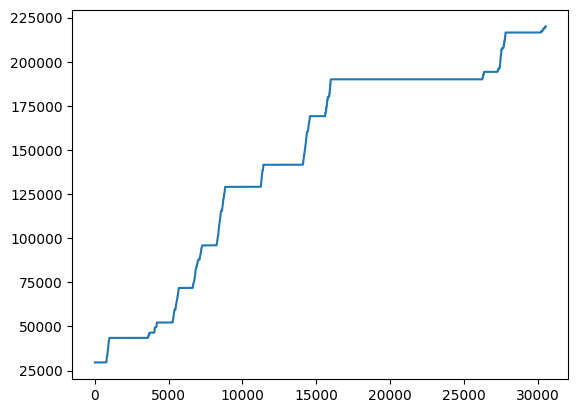

In [201]:
y_axis=[]
x_axis=[]
date=[]
raw_data_=[]

for i in range(0,unit.shape[0]):
    #print(float(fsq694_m_odometer.iloc[i,6][8:15]))
    y_axis.append(float(unit.iloc[i,4]))
    x_axis.append(i)
    date.append(unit.iloc[i,5])
    raw_data_.append(unit.iloc[i,6])

#print("Delta odometer: ",y_axis[170]-y_axis[133],'meters')

for i in range(0,len(odometer)):
    print(date[i],'->',x_axis[i],'->',y_axis[i],'->',raw_data_[i])

#print(odometer[len(odometer)-1]-odometer[0])
plt.plot(x_axis,y_axis)

Speed

In [202]:
unit_13=raw_data[raw_data['Status'].str.contains('0x252513')]
unit_14=raw_data[raw_data['Status'].str.contains('0x252514')]
unit_aux=pd.concat([unit_13,unit_14])
#unit_aux['Odometer in meters']=0.0
speed=[]
date=[]
raw=[]
unit_speed=pd.DataFrame()
unit=pd.DataFrame()

for i in range(0,unit_aux.shape[0]):
    try:
        lbs_ind=(bin(int(unit_aux.iloc[i,2][50:52],16) & 64))
        if lbs_ind=='0b1000000':
            speed.append(int(unit_aux.iloc[i,2][142:145]))  
            date.append(unit_aux.iloc[i,2][106:118])
            raw.append(unit_aux.iloc[i,2])
            print(lbs_ind)

    except:
        pass    

unit_speed['Speed']=speed
unit_speed['Date']=date
unit_speed['Raw data']=raw

unit=unit_speed.sort_values('Date',ascending=True)

print(unit.info())

0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000
0b1000000


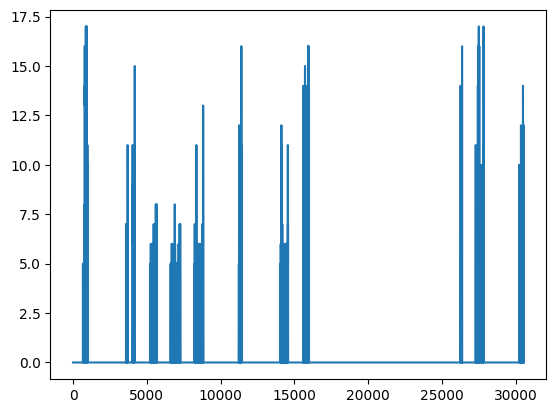

In [203]:
y_axis=[]
x_axis=[]
date=[]
raw_data_=[]

for i in range(0,unit.shape[0]):
    #print(float(fsq694_m_odometer.iloc[i,6][8:15]))
    y_axis.append(float(unit.iloc[i,0]))
    x_axis.append(i)
    date.append(unit.iloc[i,1])
    raw_data_.append(unit.iloc[i,2])

plt.plot(x_axis,y_axis)

In [204]:
print("Min speed: ",min(y_axis),'km/h',"Max speed: ",max(y_axis),'km/h',"Average speed: ",statistics.mean(y_axis),'km/h',"Mode ",statistics.mode(y_axis),'km/h',"Median: ",statistics.median(y_axis),'km/h')

for i in range(0,len(y_axis)):
    if y_axis[i]>0 and y_axis[i]<5:
        print(y_axis[i],date[i],raw_data_[i])

Min speed:  0.0 km/h Max speed:  17.0 km/h Average speed:  0.41995549446953334 km/h Mode  0.0 km/h Median:  0.0 km/h
3.0 260805151730 0x252513005917DC0869487060173472003C38402D000000304F0000000700644100000000000000FFFFFFFFFFFF00D500015121002608051517309A898144F29498C2C54A66400030011203911434FFFFFF0000350000FFFFFF
4.0 260806184751 0x25251300591D7A0869487060173472003C38402D0000003A510000000700644100000000000000FFFFFFFFFFFF00D50001E26B0026080618475133B37F44A09F98C226816640004000C403921430FFFFFF00003A0000FFFFFF
2.0 260811124045 0x252513005933680869487060173472003C38402D00000030520000000000644100000000000000FFFFFFFFFFFF00D500029DD60026081112404500B08044DD9D98C21C7466400020011303921442FFFFFF00002B0000FFFFFF
2.0 260811144645 0x252513005933D10869487060173472003C38402D00000037500000000000644100000000000000FFFFFFFFFFFF00D50002BCF7002608111446459A1981442A9898C2C94966400020001003921434FFFFFF0000360000FFFFFF
2.0 260819142436 0x252513005957CD0869487060173472003C38402D00000029500000000000644100000000

Historic events

In [205]:
unit_13=raw_data[raw_data['Status'].str.contains('0x252513')]
unit_14=raw_data[raw_data['Status'].str.contains('0x252514')]
unit_aux=pd.concat([unit_13,unit_14])
satellite_number=[]
satellite_connection_indicator=[]
date=[]
raw=[]
num_events=0
speed_aux=[]

for i in range(0,unit_aux.shape[0]):
    satellite_number.append(int(unit_aux.iloc[i,2][50:52],16) & 31)
    satellite_connection_indicator.append(int(unit_aux.iloc[i,2][50:52],16) & 128)
    date.append(unit_aux.iloc[i,2][106:118])
    speed_aux.append(int(unit_aux.iloc[i,2][142:145])) 
    raw.append(unit_aux.iloc[i,2])    

unit_aux['Satellites']=satellite_number
unit_aux['Satellite_connection_indicator']=satellite_connection_indicator
unit_aux['Raw data']=raw
unit_aux['Speed']=speed_aux
unit_aux['date']=date

unit=unit_aux.sort_values('date',ascending=True)

unit.info()

for i in range(0,unit.shape[0]):
    if unit.iloc[i,5]>0:
        num_events=num_events+1
        print(unit_aux.iloc[i,4],'->', unit_aux.iloc[i,5], '->',unit_aux.iloc[i,6],'->',unit_aux.iloc[i,8],'->',unit_aux.iloc[i,7])

print("Eventos históricos: ",num_events)

<class 'pandas.DataFrame'>
Index: 30558 entries, 1 to 47953
Data columns (total 9 columns):
 #   Column                          Non-Null Count  Dtype
---  ------                          --------------  -----
 0   Created                         30558 non-null  str  
 1   Message                         30558 non-null  str  
 2   Status                          30558 non-null  str  
 3   Headers                         30558 non-null  str  
 4   Satellites                      30558 non-null  int64
 5   Satellite_connection_indicator  30558 non-null  int64
 6   Raw data                        30558 non-null  str  
 7   Speed                           30558 non-null  int64
 8   date                            30558 non-null  str  
dtypes: int64(3), str(6)
memory usage: 2.3 MB
16 -> 0 -> 0x252513005902760869487060173472003C38402D00000041500000000700644100000000000000FFFFFFFFFFFF00D5000073AB0026080102310700E08044E09698C2F23A66400000000003921255FFFFFF00001D0000FFFFFF -> 260801023107 -> 0


Satellites Number

In [206]:
unit_13=raw_data[raw_data['Status'].str.contains('0x252513')]
unit_14=raw_data[raw_data['Status'].str.contains('0x252514')]
unit_aux=pd.concat([unit_13,unit_14])
satellite_number=[]
satellite_connection_indicator=[]
date=[]
raw=[]
num_events=0

for i in range(0,unit_aux.shape[0]):
    satellite_number.append(int(unit_aux.iloc[i,2][50:52],16) & 31)
    satellite_connection_indicator.append(int(unit_aux.iloc[i,2][50:52],16) & 128)
    date.append(unit_aux.iloc[i,2][106:118])
    raw.append(unit_aux.iloc[i,2])    

unit_aux['Satellites']=satellite_number
unit_aux['Satellite_connection_indicator']=satellite_connection_indicator
unit_aux['Raw data']=raw
unit_aux['date']=date

unit=unit_aux.sort_values('date',ascending=True)

unit.info()

for i in range(0,unit.shape[0]):
    if unit.iloc[i,4]<2:
        num_events=num_events+1
        print(unit.iloc[i,5],'->', unit.iloc[i,0], '->',unit.iloc[i,4],'->',unit.iloc[i,6])

print("Eventos históricos: ",num_events)

<class 'pandas.DataFrame'>
Index: 30558 entries, 1 to 47953
Data columns (total 8 columns):
 #   Column                          Non-Null Count  Dtype
---  ------                          --------------  -----
 0   Created                         30558 non-null  str  
 1   Message                         30558 non-null  str  
 2   Status                          30558 non-null  str  
 3   Headers                         30558 non-null  str  
 4   Satellites                      30558 non-null  int64
 5   Satellite_connection_indicator  30558 non-null  int64
 6   Raw data                        30558 non-null  str  
 7   date                            30558 non-null  str  
dtypes: int64(2), str(6)
memory usage: 2.1 MB
Eventos históricos:  0


Coordinates

In [207]:
import struct

unit_13=raw_data[raw_data['Status'].str.contains('0x252513')]
unit_14=raw_data[raw_data['Status'].str.contains('0x252514')]
unit_aux=pd.concat([unit_13,unit_14])
latitude=[]
lat_aux=[]
longitude=[]
lon_aux=[]
speed=[]
date=[]
raw=[]
num_events=0

for i in range(0,unit_aux.shape[0]):
    latitude.append(unit_aux.iloc[i,2][134:142])
    longitude.append(unit_aux.iloc[i,2][126:134])
    lon_aux.append(struct.unpack('<f', bytes.fromhex(unit_aux.iloc[i,2][126:134]))[0])
    lat_aux.append(struct.unpack('<f', bytes.fromhex(unit_aux.iloc[i,2][134:142]))[0])    
    speed.append(int(unit_aux.iloc[i,2][142:145],16))
    date.append(unit_aux.iloc[i,2][106:118])
    raw.append(unit_aux.iloc[i,2])    

unit_aux['Latitude']=latitude
unit_aux['Latitude_decoded']=lat_aux
unit_aux['Longitude']=longitude
unit_aux['Longitude_decoded']=lon_aux
unit_aux['Raw data']=raw
unit_aux['Date']=date
unit_aux['Speed']=speed

unit=unit_aux.sort_values('Date',ascending=True)

print(unit.info())

for i in range(0,unit.shape[0]):
    num_events=num_events+1
    print(unit.iloc[i,9],'->', unit.iloc[i,4], '->',unit.iloc[i,5],'->',unit.iloc[i,6],'->',unit.iloc[i,7],unit.iloc[i,8])

<class 'pandas.DataFrame'>
Index: 30558 entries, 1 to 47953
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Created            30558 non-null  str    
 1   Message            30558 non-null  str    
 2   Status             30558 non-null  str    
 3   Headers            30558 non-null  str    
 4   Latitude           30558 non-null  str    
 5   Latitude_decoded   30558 non-null  float64
 6   Longitude          30558 non-null  str    
 7   Longitude_decoded  30558 non-null  float64
 8   Raw data           30558 non-null  str    
 9   Date               30558 non-null  str    
 10  Speed              30558 non-null  int64  
dtypes: float64(2), int64(1), str(8)
memory usage: 2.8 MB
None
260801000108 -> F23A6640 -> 3.5973477363586426 -> E09698C2 -> -76.294677734375 0x252513005901FE0869487060173472003C38402D000000414F0000000700644100000000000000FFFFFFFFFFFF00D5000073AB0026080100010800E08044E09698C2F23A664

In/Outs

15      14                 13      12      11      10      09      08       07 06 05 04 03 02 01 00
Power   Ignition/Input0    Input1  Input2  Input3  Input4  Input5  Input0

15=0, Connected
15=1. Disconnected

In [208]:
unit_13=raw_data[raw_data['Status'].str.contains('0x252513')]
unit_14=raw_data[raw_data['Status'].str.contains('0x252514')]
unit_aux=pd.concat([unit_13,unit_14])
unit_aux.info()
aux_cad=[]
aux_date=[]
aux_raw_data=[]
aux_input_number=[]
in_outs=[]

#unit_aux.to_csv(r'C:\Users\Jose.Hurtado\Documents\Zonar_projects\data\sym\concatenated.csv')

for i in range(0,unit_aux.shape[0]):
    long_cad=len(unit_aux.iloc[i,2])
    if ((long_cad>48) & (long_cad<204)):
        aux_cad.append(unit_aux.iloc[i,2])   

for i in range(0,len(aux_cad)):
    aux_value=aux_cad[i][64:68]
    aux_date.append(aux_cad[i][106:118])
    aux_raw_data.append(aux_cad[i])
    in_outs.append(bin (int (aux_cad[i][64:68],16) ))      

unit_=pd.DataFrame()
unit_['in and outs']=in_outs
unit_['date']=aux_date
unit_['raw data']=aux_raw_data

in_outs_df=unit_.sort_values('date',ascending=True)

in_outs_df.to_csv(r'C:\Users\Jose.Hurtado\Documents\Zonar_projects\data\sym\in_outs.csv')

<class 'pandas.DataFrame'>
Index: 30558 entries, 1 to 47953
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   Created  30558 non-null  str  
 1   Message  30558 non-null  str  
 2   Status   30558 non-null  str  
 3   Headers  30558 non-null  str  
dtypes: str(4)
memory usage: 1.2 MB
